In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.sentiment.util import *
from nltk.util import ngrams
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

In [3]:
import re
import string
from textblob import *

In [4]:
from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import statsmodels.api as sm
from collections import Counter
from gensim.models import word2vec

In [5]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer as CV
from sklearn.feature_extraction.text import TfidfVectorizer as TV
from sklearn.naive_bayes import BernoulliNB 
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

In [6]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import GlobalAveragePooling1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [7]:
df = pd.read_csv("G:/Education/Machine Learning/ML_DATA_FILES/Womens Clothing E-Commerce Reviews.csv", index_col = [0])
df.head()

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [8]:
df.isnull().sum()

Clothing ID                   0
Age                           0
Title                      3810
Review Text                 845
Rating                        0
Recommended IND               0
Positive Feedback Count       0
Division Name                14
Department Name              14
Class Name                   14
dtype: int64

In [9]:
df.shape

(23486, 10)

### Dropping the Clothing ID & Title as they won't weigh much.

In [10]:
df.drop(columns = ['Clothing ID', 'Title'], inplace = True)

# Checking the Majority AGE Group

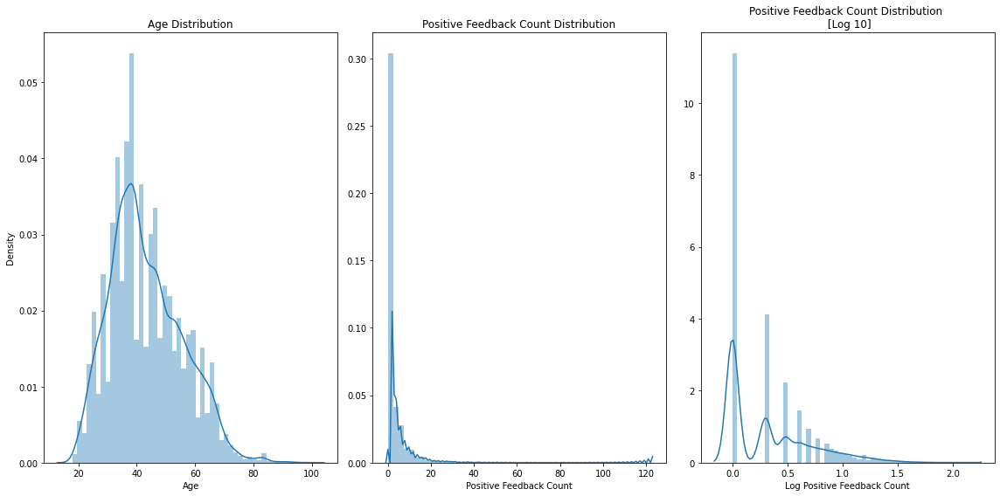

In [11]:
f, ax = plt.subplots(1, 3, figsize = (16, 8), sharey = False)

sns.distplot(df.Age, ax = ax[0])
ax[0].set_title("Age Distribution")
ax[0].set_ylabel("Density")

sns.distplot(df['Positive Feedback Count'], ax = ax[1])
ax[1].set_title("Positive Feedback Count Distribution")

sns.distplot(np.log10((df['Positive Feedback Count'][df['Positive Feedback Count'].notnull()]+1)), ax = ax[2])
ax[2].set_title("Positive Feedback Count Distribution \n [Log 10]")
ax[2].set_xlabel("Log Positive Feedback Count")

plt.tight_layout()
plt.show()

In [12]:
df1 = df[~df['Review Text'].isnull()]
df1.isnull().sum()

Age                         0
Review Text                 0
Rating                      0
Recommended IND             0
Positive Feedback Count     0
Division Name              13
Department Name            13
Class Name                 13
dtype: int64

# Data Visualization

In [13]:
import plotly.express as px

In [14]:
px.histogram(df1, x = df1['Rating'], color = df1['Recommended IND'])

In [15]:
px.histogram(df1, x = df1['Class Name'])

In [16]:
px.scatter(df1, x = 'Age', y = 'Positive Feedback Count', facet_row = 'Recommended IND', facet_col = 'Rating', trendline = 'ols', category_orders = {'Rating':[1, 2, 3, 4, 5], 'Recommended IND':[0, 1]})

### Division Vs Age W.R.T Recommended IND

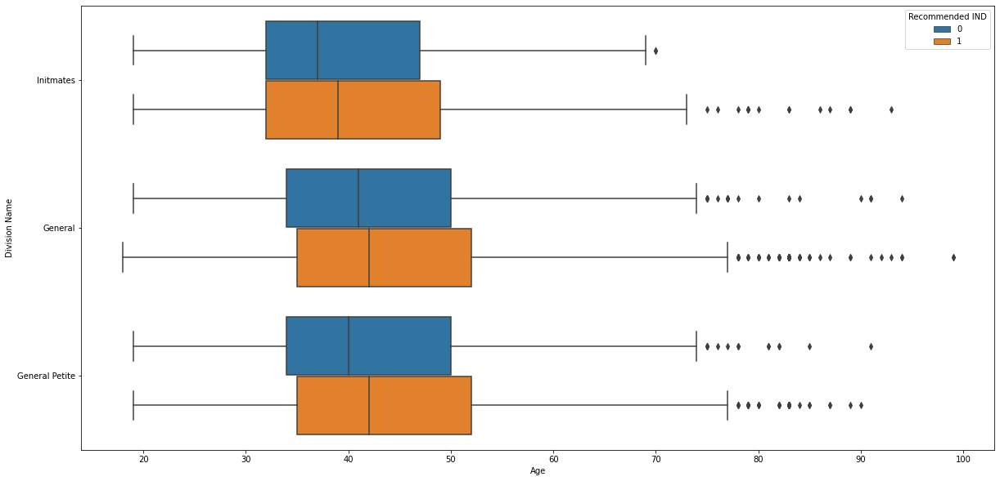

In [17]:
plt.figure(figsize = (20, 10))
sns.boxplot(data = df1, x = 'Age', y = 'Division Name', hue = 'Recommended IND')
plt.show()

In [18]:
df['Review Text'].head(20)

0     Absolutely wonderful - silky and sexy and comf...
1     Love this dress!  it's sooo pretty.  i happene...
2     I had such high hopes for this dress and reall...
3     I love, love, love this jumpsuit. it's fun, fl...
4     This shirt is very flattering to all due to th...
5     I love tracy reese dresses, but this one is no...
6     I aded this in my basket at hte last mintue to...
7     I ordered this in carbon for store pick up, an...
8     I love this dress. i usually get an xs but it ...
9     I'm 5"5' and 125 lbs. i ordered the s petite t...
10    Dress runs small esp where the zipper area run...
11    This dress is perfection! so pretty and flatte...
12    More and more i find myself reliant on the rev...
13    Bought the black xs to go under the larkspur m...
14    This is a nice choice for holiday gatherings. ...
15    I took these out of the package and wanted the...
16    Material and color is nice.  the leg opening i...
17    Took a chance on this blouse and so glad i

In [19]:
err1 = df1['Review Text'].str.extractall("(&amp)")
err2 = df1['Review Text'].str.extractall("(\xa0)")
print('With &amp', len(err1[~err1.isna()]))
print('With (\\xa0)', len(err2[~err2.isna()]))

With &amp 37
With (\xa0) 6


In [20]:
df1['Review Text'] = df1['Review Text'].str.replace('(&amp)', '')
df1['Review Text'] = df1['Review Text'].str.replace('(\xa0)', '')

In [21]:
err1 = df1['Review Text'].str.extractall("(&amp)")
err2 = df1['Review Text'].str.extractall("(\xa0)")
print('With &amp', len(err1[~err1.isna()]))
print('With (\\xa0)', len(err2[~err2.isna()]))

With &amp 0
With (\xa0) 0


In [22]:
df1['polarity'] = df1['Review Text'].map(lambda text: TextBlob(text).sentiment.polarity)
df1['polarity']

0        0.633333
1        0.339583
2        0.073675
3        0.550000
4        0.512891
           ...   
23481    0.552667
23482    0.091667
23483    0.414286
23484    0.322222
23485    0.413889
Name: polarity, Length: 22641, dtype: float64

In [23]:
px.histogram(df1, x = 'polarity', color = 'Rating', opacity = 0.5)

In [24]:
px.box(df1, x = 'Department Name', y = 'polarity', orientation = 'v', color = 'Recommended IND')

In [25]:
df1['review_len'] = df1['Review Text'].astype(str).apply(len)
px.histogram(df1, x = 'review_len', color = 'Recommended IND')

In [26]:
df1['token_count'] = df1['Review Text'].apply(lambda x: len(str(x).split()))
px.histogram(df1, x = 'token_count', color = 'Recommended IND')

### Reviews with Positive Polarity

In [27]:
sam = df1.loc[df1.polarity == 1, ['Review Text']].sample(3).values
for i in sam:
    print(i[0])

Dress is awesome and makes you look skinnier.
The details and colors are exquisite. stop hesitating and get this dress
Perfect! can't believe how inexpensive this is for the look. it looks just like it does on the model. i can't wait to wear it on my vacation.


### Reviews with Neutral Polarity

In [28]:
sam = df1.loc[df1.polarity == 0.5, ['Review Text']].sample(3).values
for i in sam:
    print(i[0])

I love the way this top fits and the way it flows. i have it in two colors.
I love this dress! i was trying on some dresses in the store and the sales girl put this one in just for fun. i would have never picked this dress out. i didn't look awesome on the hanger. but i tried it on anyway and i ended up getting two other dresses at that time. but i couldn't stop thinking about how much i loved the way i looked and felt in this dress. so i did what any girl would do and bought it online. it took me a while to find it online because the picture on line doesn't do the dres
Looks great on the model, but if you're curvy it looks very frumpy.


### Reviews with Negative Polarity

In [29]:
sam = df1.loc[df1.polarity < 0, ['Review Text']].sample(3).values
for i in sam:
    print(i[0])

No, no, no...i don't know if it was the way it got flattened out in the packaging, or what, but it sticks out like a tent from the hips down. i'm 5'7", about 145, 32c, usually wear a 6 or 8 in dresses. this thing barely buttoned over my bust, and then flares out to a tent-like triangular shape at the bottom. i don't think it would come out by washing and ironing it; i'm afraid it was just cut poorly. i looked like a sad prisoner in stripes, unfortunately. i bought three different dresses in the
I got the small; 5'7" 150 lbs,pear shaped. fit was a little sung,mainly due to the lining.i wore it once already- super cute.i washed it in cold and line dried it as i was afraid of shrinkage.i thought about getting a medium but all sizes except xs are sold out. i must be careful not to gain any more weight,otherwise the dress won't fit me anymore!
This is a cute casual dress that could be worn with flip flops or boots.


## Visualizing Polarity reviews 

In [30]:
negative = (len(df1.loc[df1.polarity < 0, ['Review Text']].values)/len(df1)) * 100
positive = (len(df1.loc[df1.polarity > 0.5, ['Review Text']].values)/len(df1)) * 100
neutral = ((len(df1.loc[df1.polarity > 0, ['Review Text']].values) - len(df1.loc[df1.polarity > 0.5, ['Review Text']].values))/len(df1)) * 100

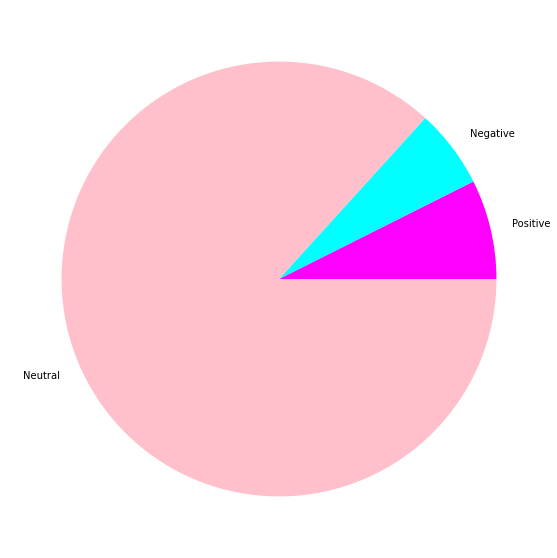

In [31]:
plt.figure(figsize = (20, 10))
plt.pie([positive, negative, neutral], labels = ['Positive', 'Negative', 'Neutral'], colors = ['magenta', 'cyan', 'pink'])
plt.show()

## Creating & Visualizing N_Grams

In [32]:
from sklearn.feature_extraction.text import CountVectorizer

In [33]:
def top_n_grams(corpus, n = None, ngram = 1):
    vec = CountVectorizer(stop_words = 'english', ngram_range = (ngram, ngram)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis = 0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)
    return words_freq[:n]

#### Visualizing top 10 UniGrams

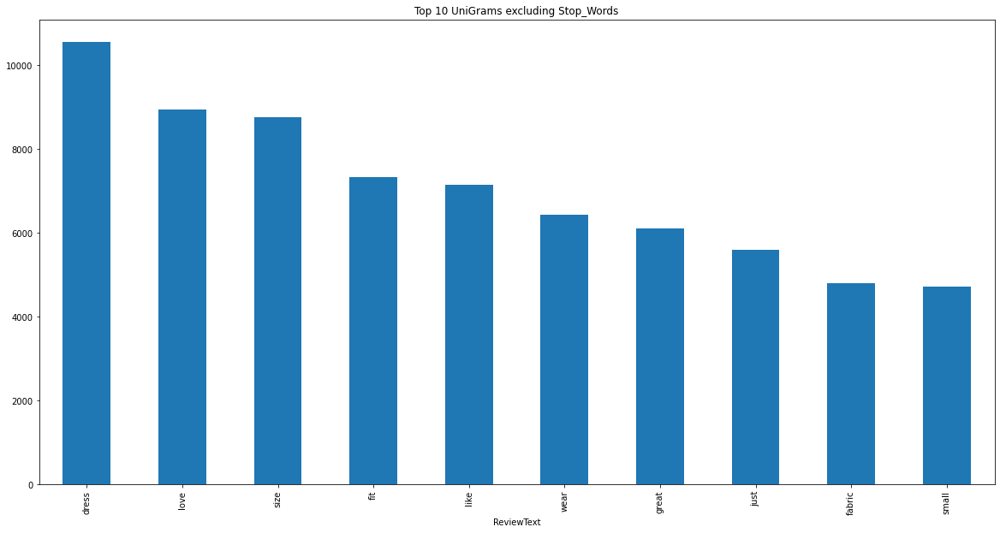

In [34]:
common_words = top_n_grams(df1['Review Text'], 10, 1)
df = pd.DataFrame(common_words, columns = ['ReviewText', 'count'])

plt.figure(figsize = (20,10))
df.groupby('ReviewText').sum()['count'].sort_values(ascending = False).plot(kind = 'bar', title = "Top 10 UniGrams excluding Stop_Words")
plt.show()

#### Visualizing top 20 BIGrams

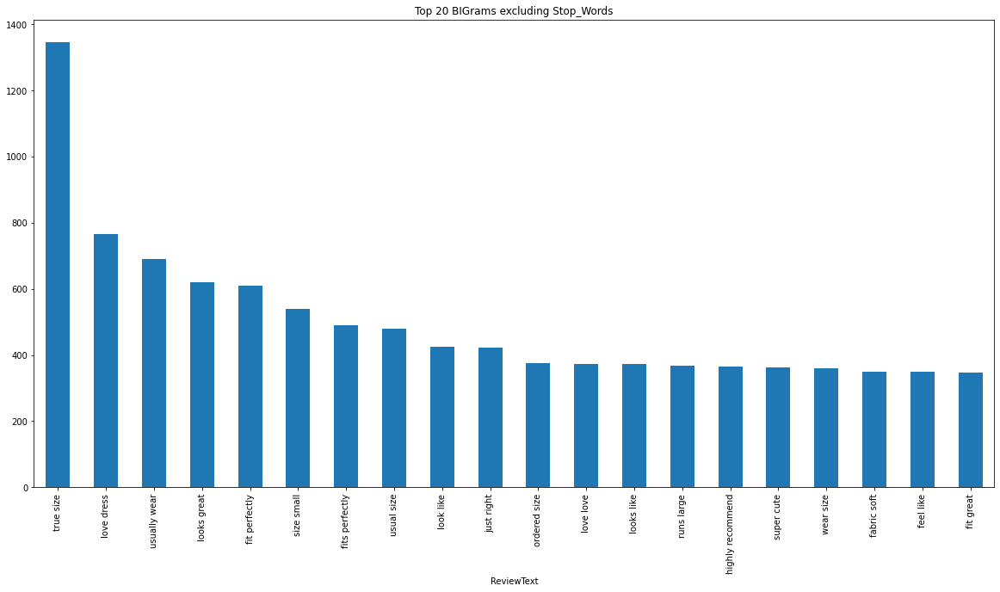

In [35]:
common_words = top_n_grams(df1['Review Text'], 20, 2)
df = pd.DataFrame(common_words, columns = ['ReviewText', 'count'])

plt.figure(figsize = (20,10))
df.groupby('ReviewText').sum()['count'].sort_values(ascending = False).plot(kind = 'bar', title = "Top 20 BIGrams excluding Stop_Words")
plt.show()

### Visualizing top 30 Tri Grams

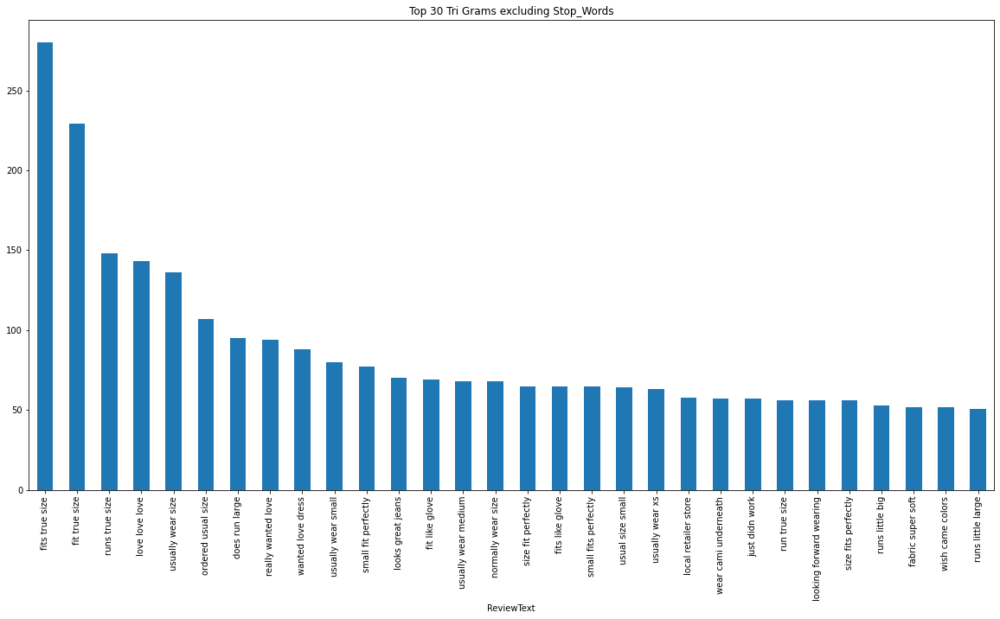

In [36]:
common_words = top_n_grams(df1['Review Text'], 30, 3)
df = pd.DataFrame(common_words, columns = ['ReviewText', 'count'])

plt.figure(figsize = (20,10))
df.groupby('ReviewText').sum()['count'].sort_values(ascending = False).plot(kind = 'bar', title = "Top 30 Tri Grams excluding Stop_Words")
plt.show()

### Visualizng top 10 P.O.S Tags 

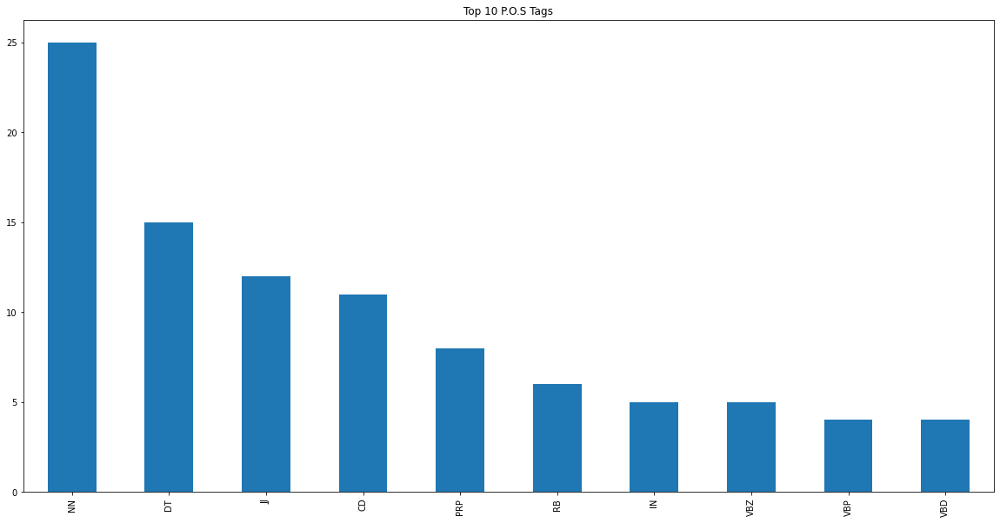

In [37]:
blob = TextBlob(str(df1['Review Text']))
pos = pd.DataFrame(blob.tags, columns = ['word', 'pos'])
pos1 = pos.pos.value_counts()[:10]

plt.figure(figsize = (20, 10))
pos1.plot(kind = 'bar', title = 'Top 10 P.O.S Tags')

In [38]:
y = df1['Recommended IND']
x = df1.drop(columns = 'Recommended IND')

In [39]:
print("Shape of X: " , x.shape)
print("Shape of y: " , y.shape)

Shape of X:  (22641, 10)
Shape of y:  (22641,)


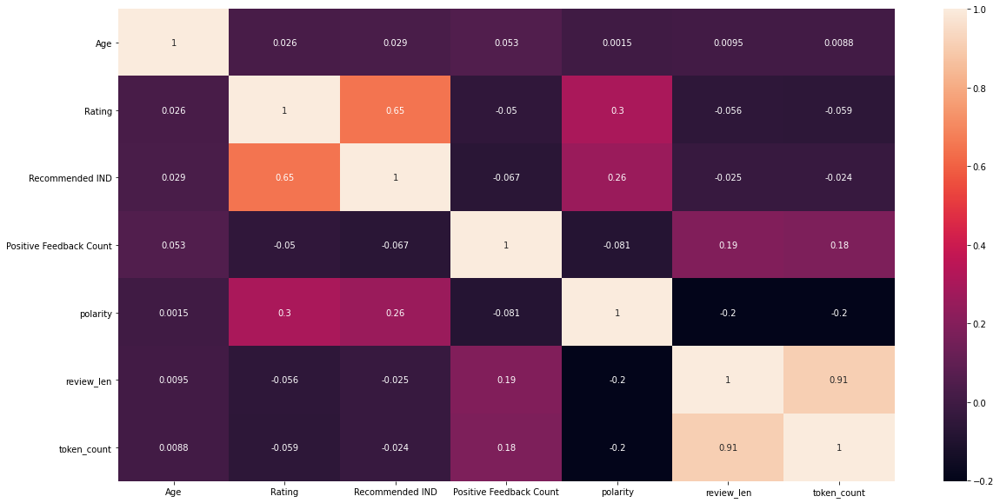

In [40]:
corr = df1.corr(method = 'kendall')
plt.figure(figsize = (20,10))
sns.heatmap(corr, annot = True)
df1.columns
plt.show()

In [41]:
set1 =set()
cor = x.corr()
for i in cor.columns:
    for j in cor.columns:
        if cor[i][j]>0.8 and i!=j:
            set1.add(i)
print(set1)
x = x.drop(labels = ['token_count'],axis = 1)
print("correlation: ", x.corr())

{'token_count', 'review_len'}
correlation:                                Age    Rating  Positive Feedback Count  \
Age                      1.000000  0.029962                 0.040850   
Rating                   0.029962  1.000000                -0.060984   
Positive Feedback Count  0.040850 -0.060984                 1.000000   
polarity                 0.006649  0.386303                -0.083379   
review_len               0.014954 -0.056190                 0.191214   

                         polarity  review_len  
Age                      0.006649    0.014954  
Rating                   0.386303   -0.056190  
Positive Feedback Count -0.083379    0.191214  
polarity                 1.000000   -0.290695  
review_len              -0.290695    1.000000  


# Model 1

In [42]:
nltk.download('stopwords')
corpus = []
x.index = np.arange(len(x))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\varun\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [43]:
len(x)

22641

In [44]:
from tqdm import tqdm

In [45]:
for i in tqdm(range(len(x))):
    review = re.sub('[^a-zA-z]',' ',x['Review Text'][i])
    review = review.lower()
    review = review.split()
    ps = PorterStemmer()
    review =[ps.stem(i) for i in review if not i in set(stopwords.words('english'))]
    review =' '.join(review)
    corpus.append(review)
corpus[0:5]

100%|████████████████████████████████████████████████████████████████████████████| 22641/22641 [17:20<00:00, 21.76it/s]


['absolut wonder silki sexi comfort',
 'love dress sooo pretti happen find store glad bc never would order onlin bc petit bought petit love length hit littl knee would definit true midi someon truli petit',
 'high hope dress realli want work initi order petit small usual size found outrag small small fact could zip reorder petit medium ok overal top half comfort fit nice bottom half tight layer sever somewhat cheap net layer imo major design flaw net layer sewn directli zipper c',
 'love love love jumpsuit fun flirti fabul everi time wear get noth great compliment',
 'shirt flatter due adjust front tie perfect length wear leg sleeveless pair well cardigan love shirt']

In [46]:
len(corpus)

22641

## Creating Word Vector

In [47]:
cv = CV(max_features = 3000, ngram_range = (1,1))
x_cv = cv.fit_transform(corpus).toarray()
y = y.values

In [48]:
x_train, x_test, y_train, y_test = train_test_split(x_cv, y, test_size = 0.3, random_state = 0)

In [49]:
classifier = BernoulliNB()
classifier.fit(x_train, y_train)

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)

In [50]:
y_prediction = classifier.predict(x_test)

In [51]:
acc = accuracy_score(y_test, y_prediction)

In [52]:
print('Accuracy of Classifier: ',acc)
print('Confusion Matrix is: \n', confusion_matrix(y_test, y_prediction))
print('Classification Report: \n', classification_report(y_test, y_prediction))

Accuracy of Classifier:  0.8735462976593552
Confusion Matrix is: 
 [[ 900  368]
 [ 491 5034]]
Classification Report: 
               precision    recall  f1-score   support

           0       0.65      0.71      0.68      1268
           1       0.93      0.91      0.92      5525

    accuracy                           0.87      6793
   macro avg       0.79      0.81      0.80      6793
weighted avg       0.88      0.87      0.88      6793



## Tf-idf Formation

In [53]:
tv  = TV(ngram_range =(1,1),max_features = 3000)
x_tv = tv.fit_transform(corpus).toarray()
x_train, x_test, y_train, y_test = train_test_split(x_tv, y, test_size = 0.30, random_state = 0)

In [54]:
classifier = MultinomialNB()
classifier.fit(x_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [55]:
y_prediction = classifier.predict(x_test)
acc = accuracy_score(y_test, y_prediction)
print("Accuracy of the classifier: ",acc)
print("Confusion matrix is :\n",metrics.confusion_matrix(y_test,y_prediction))
print("Classification report: \n" ,metrics.classification_report(y_test,y_prediction))

Accuracy of the classifier:  0.8418960694832917
Confusion matrix is :
 [[ 229 1039]
 [  35 5490]]
Classification report: 
               precision    recall  f1-score   support

           0       0.87      0.18      0.30      1268
           1       0.84      0.99      0.91      5525

    accuracy                           0.84      6793
   macro avg       0.85      0.59      0.60      6793
weighted avg       0.85      0.84      0.80      6793



## ANN Model

In [56]:
tokenizer = Tokenizer(num_words = 3000)
tokenizer.fit_on_texts(corpus)
sequences = tokenizer.texts_to_sequences(corpus)
padded = pad_sequences(sequences, padding='post')
word_index = tokenizer.word_index
count = 0
for i,j in word_index.items():
    if count == 11:
        break
    print(i,j)
    count = count+1

dress 1
fit 2
love 3
size 4
look 5
top 6
wear 7
like 8
color 9
great 10
would 11


In [57]:
embedding_dim = 64

In [58]:
model = Sequential([
    Embedding(3000, embedding_dim),
    GlobalAveragePooling1D(),
    Dense(6, activation = 'relu'),
    Dense(1, activation = 'sigmoid')
])

Instructions for updating:
Colocations handled automatically by placer.


In [59]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, None, 64)          192000    
_________________________________________________________________
global_average_pooling1d (Gl (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 6)                 390       
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 7         
Total params: 192,397
Trainable params: 192,397
Non-trainable params: 0
_________________________________________________________________


In [60]:
model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

In [61]:
model.fit(padded, y, epochs = 20, validation_split = 0.3)

Train on 15848 samples, validate on 6793 samples
Instructions for updating:
Use tf.cast instead.
Epoch 1/20
15848/15848 [==============================] - 7s 417us/sample - loss: 0.4492 - acc: 0.8215 - val_loss: 0.3828 - val_acc: 0.8126
Epoch 2/20
15848/15848 [==============================] - 5s 321us/sample - loss: 0.2884 - acc: 0.8695 - val_loss: 0.2841 - val_acc: 0.8706
Epoch 3/20
15848/15848 [==============================] - 5s 309us/sample - loss: 0.2336 - acc: 0.9017 - val_loss: 0.2751 - val_acc: 0.8790
Epoch 4/20
15848/15848 [==============================] - 4s 247us/sample - loss: 0.2169 - acc: 0.9099 - val_loss: 0.2709 - val_acc: 0.8852
Epoch 5/20
15848/15848 [==============================] - 5s 339us/sample - loss: 0.2049 - acc: 0.9163 - val_loss: 0.2747 - val_acc: 0.8846
Epoch 6/20
15848/15848 [==============================] - 4s 266us/sample - loss: 0.1956 - acc: 0.9205 - val_loss: 0.2781 - val_acc: 0.8830
Epoch 7/20
15848/15848 [==============================] - 6s 38

In [62]:
loss = model.history.history
loss = pd.DataFrame(loss)

ValueError: x and y must have same first dimension, but have shapes (10,) and (20,)

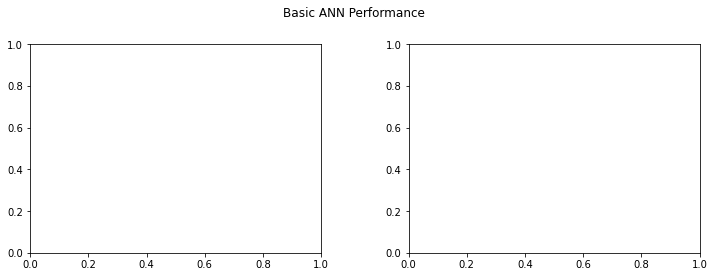

In [63]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle('Basic ANN Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = range(1,11)
ax1.plot(epoch_list, loss['acc'], label='Train Accuracy')
ax1.plot(epoch_list, loss['val_acc'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, 11, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, loss['loss'], label='Train Loss')
ax2.plot(epoch_list, loss['val_loss'], label='Validation Loss')
ax2.set_xticks(np.arange(0, 11, 1))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

### Checking the Model on Random String

In [64]:
sample_string = "I hate it"
sample = tokenizer.texts_to_sequences(sample_string)
padded_sample = pad_sequences(sample, padding='post')
print("Padded sample", padded_sample.T)
print("Probabilty of a person recommending :",model.predict(padded_sample.T)[0][0]*100,"%")

Padded sample [[   0    0 1473    0    0 1114    0    0    0]]
Probabilty of a person recommending : 0.052673654863610864 %


In [65]:
sample_string = "i love the fabric"
sample = tokenizer.texts_to_sequences(sample_string)
padded_sample = pad_sequences(sample, padding='post')
print("Padded sample", padded_sample.T)
print("Probabilty of a person recommending :",model.predict(padded_sample.T)[0][0]*100,"%")

Padded sample [[   0    0  280    0  411 1114    0    0 1473 1114    0  932    0  268
  1308    0  225]]
Probabilty of a person recommending : 99.98975992202759 %
